In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from collections import deque
%matplotlib inline
output_notebook()

Loading BokehJS ...

In [2]:
# Reading the data 
df = pd.read_csv('./data.txt', header=None, index_col=[0])

In [3]:
df.index.name = None
df.columns = ['power']
df.head()

,power
1312182000,1322
1312182001,1322
1312182002,1328
1312182003,1328
1312182004,1328


In [4]:
# Formatting the datetime 
df.index = pd.to_datetime(df.index, unit='s').tz_localize('UTC')
df.index = df.index.tz_convert('America/Los_Angeles').tz_localize(None) #Converting to the PDT time 
df.head()

,power
2011-08-01 00:00:00,1322
2011-08-01 00:00:01,1322
2011-08-01 00:00:02,1328
2011-08-01 00:00:03,1328
2011-08-01 00:00:04,1328


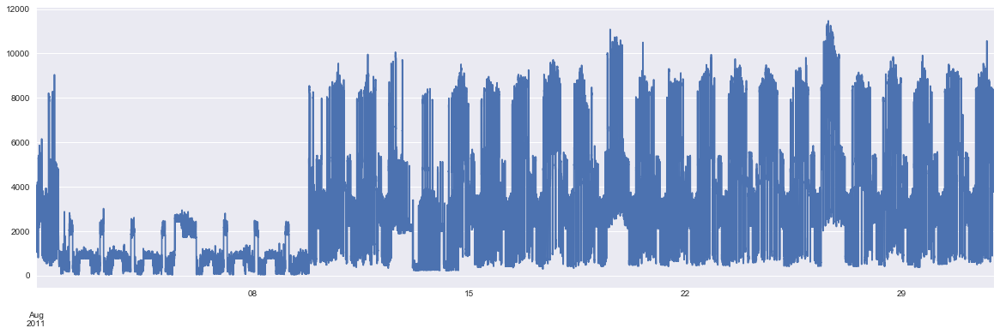

In [5]:
df['power'].resample('30s').mean().plot(figsize=(20,6))

In [6]:
temp_df = df.copy()
temp_df['day'] = df.index.day
temp_df['hour'] = df.index.hour

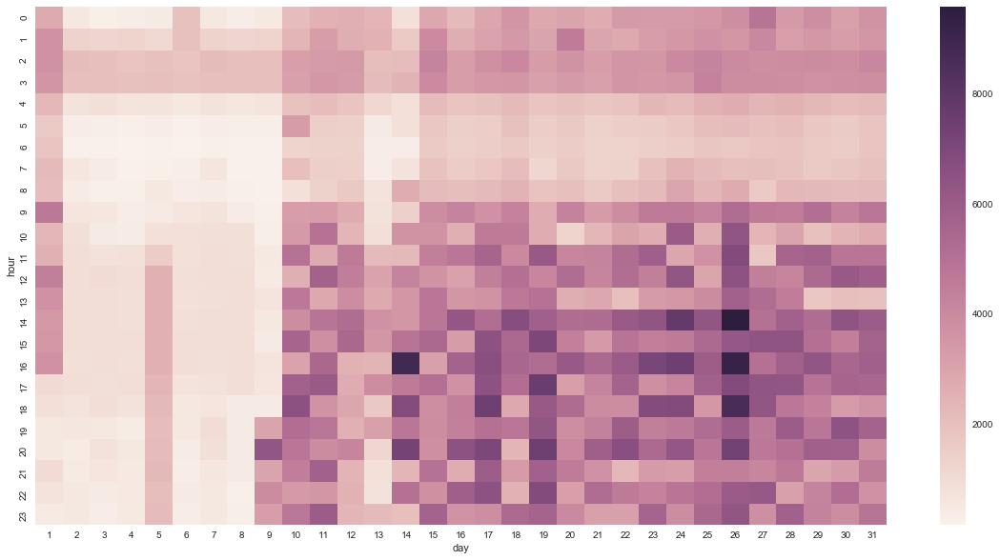

In [7]:
plt.figure(figsize=(20,10))
sns.heatmap(temp_df.groupby(['day', 'hour']).mean().reset_index().pivot('hour', 'day', 'power'))

** We see that between midnight and 3am the consumption is higher and a drastic decrease in the consumption occurs at around 3am . This indicates something comes on at scheduled time => Could be the pump**

** Downsampling the data for further processing **

In [8]:
dfs = df.resample('5s').mean()

In [9]:
dfs.head()

,power
2011-08-01 00:00:00,1325.6
2011-08-01 00:00:05,1323.2
2011-08-01 00:00:10,1320.0
2011-08-01 00:00:15,1318.8
2011-08-01 00:00:20,1321.6


# Edge/Transition Detection + Pairing

** Edge/Transition detection **

In [10]:
def find_transitions(dataframe, state_threshold=30, noise_level=70):
    '''
    
    Parameters
    ----------
    dataframe : pd.DataFrame where df.index is datetime(tz-naive) and there is one column containing power
    state_threshold : maximum difference b/w highest and lowest value in steady state in Watts
    noise_level : transitions below this level are ignored

    Returns
    -------

    '''
    num_measurements = len(dataframe.columns)
    previous_measurement = np.array([0] * num_measurements)

    df = pd.DataFrame(index= dataframe.index, data=dataframe.values, columns=["Power"])

    df['diff'] = np.fabs(df['Power'].diff())
    df.ix[0,'diff'] = (np.fabs(np.subtract(df.ix[0,'Power'], previous_measurement)))

    # Detecting if there was an instantaneous change
    df['instantaneous_change'] = (df['diff'] >state_threshold).astype(bool)
    
    
    # We want to estimate the steady state after each edge
    df['indicator'] = np.arange(1, df.shape[0]+1)
    df['indicator'] = df['indicator'] * df['instantaneous_change']
    df.loc[df['indicator']==0,'indicator'] = np.nan
    df.ix[0, 'indicator'] = 0
    
    df['indicator'].fillna(method = 'ffill', inplace = True) # Make the value of 'indicator' to be the same in between edges 
    df = df.join(df.groupby('indicator')['Power'].mean(), on ='indicator', rsuffix='_r')
    df.rename(columns={'Power_r':'estimated_steady_power'}, inplace =True)
 
    
    ## Get steady power before each of the edges ##
    
    # condition to get instants when transition is starting and not ongoing
    df.ix[1:, 'ongoing_change']=  df['instantaneous_change'].shift(1)
    df.ix[0, 'ongoing_change'] = False
    df['ongoing_change'] = df['ongoing_change'].astype(bool)
    condition = (df['instantaneous_change'] & ~df['ongoing_change'])
    
    df.loc[condition,'last_steady_power'] = df['estimated_steady_power'].shift(1)[condition]
    df.ix[0, 'last_steady_power'] = 0
    df['last_steady_power'].fillna(method = 'ffill', inplace=True)

    ## Get the transition time ##
    df.loc[condition,'Time'] = df[condition].index
    df['Time'] = df['Time'].shift(1)
    df.ix[0, 'Time'] = dataframe.iloc[0].name
    df['Time'].fillna(method = 'ffill', inplace = True)

    # calculating last_transition
    df.loc[condition, 'last_transition'] = (df['estimated_steady_power']- df['last_steady_power']).shift(1)[condition]

    # adding steady states
    df.loc[condition, 'steady_states'] = df.loc[condition, 'estimated_steady_power'].shift(1)

    # appending the very last transition:
    df.loc[df.index[-1],'last_transition'] = df.loc[df.index[-1], 'estimated_steady_power'] - df.loc[df.index[-1], 'last_steady_power']
    df.loc[df.index[-1],'steady_states'] = df.loc[df.index[-1], 'estimated_steady_power']
   
                 
    # Removing all the transitions/below the noise level
    transitions = df.loc[np.fabs(df['last_transition']) >noise_level, ['Time', 'last_transition']]
    transitions.set_index('Time', inplace = True)
    

    transitions.rename(columns={"last_transition":'active transition'}, inplace = True)
    
    if len(transitions)>0:
        # checking if the very first reading of the measurements is included in the transitions which is trivial
        if transitions.index[0] == dataframe.iloc[0].name:
            transitions = transitions.iloc[1:,:]

    return transitions

** Pairing **

In [11]:
class MyDeque(deque):
    def popmiddle(self, pos):
        self.rotate(-pos)
        ret = self.popleft()
        self.rotate(pos)
        return ret

class PairBuffer(object):

    def __init__(self, buffer_size, min_tolerance, percent_tolerance,
                 large_transition):
        """
        Parameters
        ----------
        buffer_size: int, optional
            size of the buffer to use for finding edges
        min_tolerance: int, optional
            variance in power draw allowed for pairing a match
        percent_tolerance: float, optional
            if transition is greater than large_transition, then use percent of large_transition
        large_transition: float, optional
            power draw of a Large transition
        """
        # We use a deque here, because it allows us quick access to start and end popping
        # and additionally, we can set a maxlen which drops oldest items.
        self._buffer_size = buffer_size
        self._min_tol = min_tolerance
        self._percent_tol = percent_tolerance
        self._large_transition = large_transition
        self.transition_list = MyDeque([], maxlen=self._buffer_size)
       
        self.pair_columns = ['T1 Time', 'T1 Active',
                                 'T2 Time', 'T2 Active']
        self.matched_pairs = pd.DataFrame(columns=self.pair_columns)

    def clean_buffer(self):
        # Remove any matched transactions
        for idx, entry in enumerate(self.transition_list):
            if entry[2]:
                self.transition_list.popmiddle(idx)
                self.clean_buffer()
                break
              

    def add_transition(self, transition):
        # Check transition is as expected.
        assert isinstance(transition, (tuple, list))

        # Convert as appropriate
        if isinstance(transition, tuple):
            mtransition = list(transition)
        # Add transition to List of transitions (set marker as unpaired)
        mtransition.append(False)
        self.transition_list.append(mtransition)


    def pair_transitions(self):
        """
        The correct way to search the buffer is to start by checking
        elements which are close together in the buffer, and gradually
        increase the distance. First, adjacent  elements are checked for
        pairs which meet all four requirements above; if any are found
        they are processed and marked. Then elements two entries apart
        are checked, then three, and so on, until the first and last
        element are checked...
        """

        tlength = len(self.transition_list)
        pairmatched = False
        if tlength < 2:
            return pairmatched


        # Start the element distance at 1, go up to current length of buffer
        for eDistance in range(1, tlength):
            idx = 0
            while idx < tlength - 1:
                # We don't want to go beyond length of array
                compindex = idx + eDistance
                if compindex < tlength:
                    val = self.transition_list[idx]

                    if (val[1] > 0) and (val[2] is False):
                        compval = self.transition_list[compindex]
                        if compval[2] is False:
                            # Add the two elements for comparison
                            vsum = np.add(val[1],compval[1])
                            # Set the allowable tolerance
                            matchtols = self._min_tol
    
                            matchtols = self._min_tol if (max(np.fabs([val[1], compval[1]]))
                                                                      < self._large_transition) else (self._percent_tol
                                                                                                      * max(np.fabs([val[1], compval[1]])))
                    

                            condition = np.fabs(vsum) < matchtols

                            if condition:
                                # Mark the transition as complete
                                self.transition_list[idx][2] = True
                                self.transition_list[compindex][2] = True
                                pairmatched = True

                                # Append the OFF transition to the ON. Add to
                                # dataframe.
                                matchedpair = val[0:2] + compval[0:2]
                                self.matched_pairs.loc[len(self.matched_pairs)] = matchedpair

                    # Iterate Index
                    idx += 1
                else:
                    break

        return pairmatched


In [12]:
def generate_events(transitions):
    subset = list(transitions.itertuples())
    pair_obj = PairBuffer(buffer_size=20, min_tolerance=100, percent_tolerance=0.10,
                          large_transition=1000)

    for s in subset:
        if len(pair_obj.transition_list) == 20:
            pair_obj.clean_buffer()
        pair_obj.add_transition(s)
        pair_obj.pair_transitions()
    events = pair_obj.matched_pairs.sort_values(by='T1 Time')

    if len(events) >= 1:
        events['Average power'] = (np.abs(events['T1 Active']) + np.abs(events['T2 Active'])) / 2
        events['Duration'] = (events['T2 Time'] - events['T1 Time']).dt.total_seconds()
    else:
        events = None
        
    return events

In [13]:
transitions = find_transitions(dfs,state_threshold=30, noise_level=50)
events = generate_events(transitions)

In [14]:
print "Total events detected: ", len(events)

Total events detected:  5758


In [15]:
events.describe()

,T1 Active,T2 Active,Average power,Duration
count,5758.000000,5758.000000,5758.000000,5758.000000
mean,744.157579,-718.560262,731.358920,1886.866099
std,1175.883848,1140.591755,1157.253442,5248.514993
min,50.072050,-7806.800000,51.068687,10.000000
25%,120.001543,-369.720592,115.365688,205.000000
50%,176.374090,-151.200515,155.622954,660.000000
75%,375.598246,-113.873333,364.239131,1313.750000
max,7299.533333,-50.038907,7553.166667,93515.000000


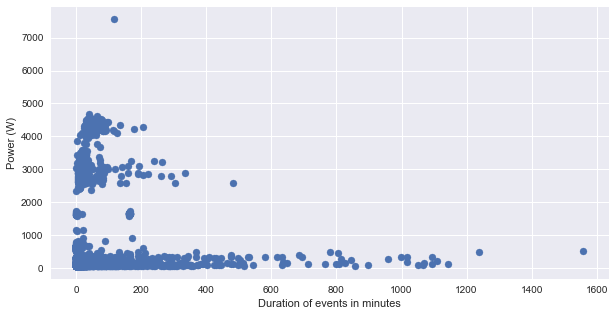

In [16]:
plt.figure(figsize=(10,5))
plt.scatter(events['Duration']/60, events['Average power'])
plt.xlabel("Duration of events in minutes")
plt.ylabel("Power (W)")


** Filtering out large events to take a closer look at them **

In [17]:
large_power = 500
large_duration = 300
events_large = events[(events['Average power'] >= large_power) & (events['Duration'] > large_duration)]
print "Number of large events: ", len(events_large)

Number of large events:  1072


In [18]:
events_large.head()

,T1 Time,T1 Active,T2 Time,T2 Active,Average power,Duration
20,2011-08-01 00:08:35,2728.304000,2011-08-01 02:24:40,-2462.813333,2595.558667,8165.0
11,2011-08-01 00:32:15,2720.647149,2011-08-01 01:23:10,-2505.877288,2613.262219,3055.0
13,2011-08-01 01:31:50,2660.400000,2011-08-01 01:42:10,-2467.317647,2563.858824,620.0
17,2011-08-01 01:51:20,2751.961180,2011-08-01 02:01:10,-2478.995556,2615.478368,590.0
27,2011-08-01 03:38:35,2595.143386,2011-08-01 03:49:25,-2454.198547,2524.670967,650.0


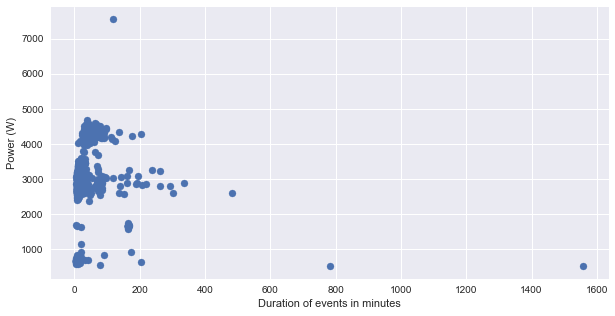

In [19]:
plt.figure(figsize=(10,5))
plt.scatter(events_large['Duration']/60, events_large['Average power'])
plt.xlabel("Duration of events in minutes")
plt.ylabel("Power (W)")


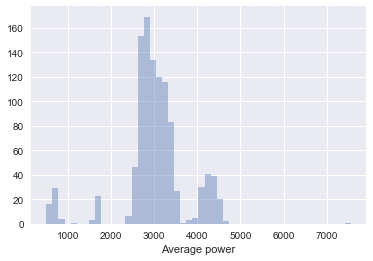

In [20]:
sns.distplot(events_large['Average power'], kde=False)

** Filtering out small events to take a closer look at them **

In [21]:
small_power = 500 # only looking at events less than 500 W
small_duration_min = 300 # 5 mins
small_duration_max = 10800 # 2 hours

events_small = events[(events['Average power'] < small_power) & 
                      (events['Duration'] >= small_duration_min) & (events['Duration'] < small_duration_max)]
print "Number of small events: ", len(events_small)

Number of small events:  2631


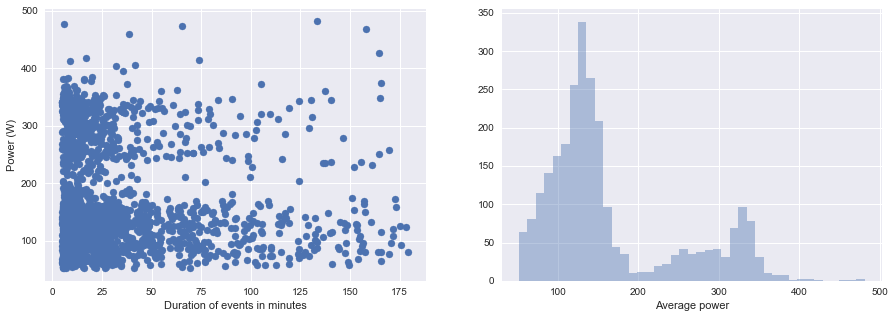

In [22]:
plt.figure(figsize=(15,5))

plt.subplot(121)
plt.scatter(events_small['Duration']/60, events_small['Average power'])
plt.xlabel("Duration of events in minutes")
plt.ylabel("Power (W)")

plt.subplot(122)
sns.distplot(events_small['Average power'], kde=False)

From the above two graphs we can see that these "small" events cluster around two distinct powers
* About 120 W
* About 300 W

Now from the heat plot we can see that there are less devices running between 4am and 7 am in the house.
Even the time series plot shows less appliance activity during this period. Most of this activity would come from fridge and we can get an idea of the fridge properties by filtering events during this time

In [23]:
events_small_morning = events_small[(events_small['T1 Time'].dt.hour >=4)& (events_small['T2 Time'].dt.hour<7)]

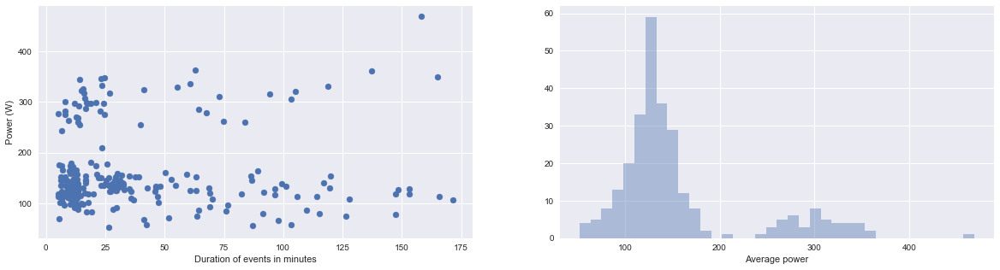

In [24]:
plt.figure(figsize=(20,5))
plt.subplot(121)
plt.scatter(events_small_morning['Duration']/60, events_small_morning['Average power'])
plt.xlabel("Duration of events in minutes")
plt.ylabel("Power (W)")

plt.subplot(122)
sns.distplot(events_small_morning['Average power'], kde=False)

* This shows that there are two fridges or 1 fridge and 1 freezer in the house.

* So we can try a cluster model on this morning data and use that to filter the "small" events 

# Event filtering  for large appliances

We have been given following info about the major appliances 

* Central AC 1 - The most common repeating pulse. (At about 2.5 KW amplitude and a width of about 10 minutes)- > 
* Central AC 2 - Another repeating pulse but less frequent (At about 4 KW amplitude and > 30 minute width)
* Pool Pump - Runs for a duration of about 3 hours at 1.5 KW amplitude. Starts at the same time everyday.
* Refrigerator - This is the smallest amplitude repeating pulse at < 200 W

Based on this information, we can write simple rules to filter out events corresponding to different appliances 

** Lets begin with the larger appliances. Simple rules based on the above provided meta information does a good job at identifying them **

In [25]:
eventsAc1 = events[(events['Average power']>=2000) & (events['Average power']<4000) & (events['Duration']<1200) & (events['Duration']>=300)]
eventsAc2 = events[(events['Average power']>=3500) & (events['Average power']<5000) & (events['Duration']>1800)]
eventsPool = events[(events['Average power']>=1000)  & (events['Average power']<2000) & (events['Duration']>=7200)  & (events['Duration']<=14400)]

Lets look at the plot of filtered events and the measurements 

In [26]:
p = figure(width=1000, height=500, x_axis_type='datetime')
dfmin = dfs.resample('60s').mean() # Too reduce the number of data points that are being plotted. Bokeh limits are reached otherwise
p.line(dfmin.index, dfmin['power'].values)
p.scatter(eventsAc1['T1 Time'].values, eventsAc1["Average power"], color='green')
p.scatter(eventsAc1['T2 Time'].values, eventsAc1["Average power"], color='red')

p.scatter(eventsAc2['T1 Time'].values, eventsAc2["Average power"], color='blue')
p.scatter(eventsAc2['T2 Time'].values, eventsAc2["Average power"], color='black')

p.scatter(eventsPool['T1 Time'].values, eventsPool["Average power"], color='yellow')
p.scatter(eventsPool['T2 Time'].values, eventsPool["Average power"], color='orange')

show(p)


** We want to convert events to time series **

In [27]:
def events_to_series(events, mains):
    predictions = pd.Series(index=mains.index, data=np.zeros(mains.shape[0]))
    for _, event in events.iterrows():
        predictions[event['T1 Time']:event['T2 Time']] += event['Average power']
    return predictions 


In [28]:
disaggAc1 = events_to_series(eventsAc1, df)
disaggAc2 = events_to_series(eventsAc2, df)
disaggPool = events_to_series(eventsPool, df)


In [29]:
# Too reduce the number of data points that are being plotted. Bokeh limits are reached otherwise.
dfmin = dfs.resample('60s').mean() 
disaggAc1_min = disaggAc1.resample('60s').mean()
disaggAc2_min = disaggAc2.resample('60s').mean()
disaggPool_min = disaggPool.resample('60s').mean()


In [30]:
p = figure(width=1000, height=250, x_axis_type='datetime')
p.line(dfmin.index, dfmin['power'].values)
p.line(disaggAc1_min.index, disaggAc1_min.values, color= 'blue')

show(p)

In [31]:
p = figure(width=1000, height=250, x_axis_type='datetime')
p.line(dfmin.index, dfmin['power'].values)
p.line(disaggAc2_min.index, disaggAc2_min.values, color = 'green')
show(p)

In [32]:
p = figure(width=1000, height=250, x_axis_type='datetime')

p.line(dfmin.index, dfmin['power'].values)
p.line(disaggPool_min.index, disaggPool_min.values, color ='red')
show(p)

# Now lets take a look at refrigerator

* Extracting "small" and "small+ morning events" based on the discussion in the earlier section
* We train a refrigeration model with 2 features- Average power, Average Duration using morning events
* We classify the rest of the points based on the above model


We have been given the following information about refrigerator
* Refrigerator - This is the smallest amplitude repeating pulse at < 200 W


In [33]:
small_power = 500 # only looking at events less than 500 W
small_duration_min = 300 # 5 mins
small_duration_max = 10800 # 3 hours

events_small = events[(events['Average power'] < small_power) & 
                      (events['Duration'] >= small_duration_min) & (events['Duration'] < small_duration_max)]
events_small_morning = events_small[(events_small['T1 Time'].dt.hour >=4)& (events_small['T2 Time'].dt.hour<7)]

In [34]:
print "Number of training points", len(events_small_morning)
print "Number of points", len(events_small)

Number of training points 276
Number of points 2631


In [35]:
x_train = events_small_morning[['Duration', 'Average power']].values 
x = events_small[['Duration', 'Average power' ]].values 


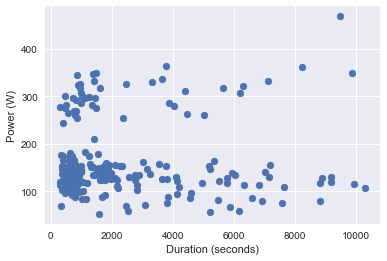

In [36]:
plt.scatter(x_train[:,0],x_train[:,1], cmap='viridis')
plt.ylabel("Power (W)")
plt.xlabel("Duration (seconds)")

In [37]:
from sklearn.mixture import GaussianMixture 
from sklearn.preprocessing import StandardScaler

def cluster(data, num_clusters):
    # We want to scale the two features before clustering 
    scale = StandardScaler()
    data = scale.fit_transform(data)
    
    if num_clusters:
        gmm = GaussianMixture (num_clusters,covariance_type='diag')
        gmm.fit(data, None)
        return scale, gmm
    aic= []
    for i in range(2,10):
        gmm = GaussianMixture (i, covariance_type='diag')
        gmm.fit(data, None)
        aic.append(gmm.aic(data))
    plt.plot(range(2,10), aic)
    plt.xlabel("Number of clusters")
    plt.ylabel("AIC")
    return None, None

GMM with diagonal matrices should be good for clustering this. Need to find the optimal number of clusters.  

(None, None)

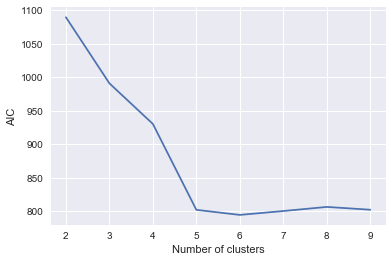

In [38]:
cluster(x_train, None)

 The above plot suggests that the optimal number of clusters are 5 

In [39]:
scale, gmm = cluster(x_train, 5)
labels = gmm.predict(scale.transform(x_train))


In [46]:
centroids = scale.inverse_transform(gmm.means_)

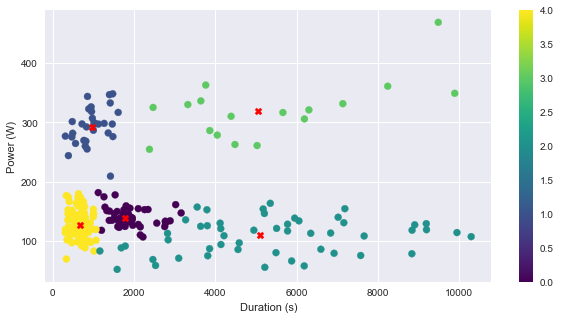

In [48]:
plt.figure(figsize=(10,5))
plt.scatter(x_train[:,0],x_train[:,1], c=labels, cmap='viridis')
plt.colorbar()
plt.scatter(centroids[0,0],centroids[0,1], color='red' ,marker='X')
plt.scatter(centroids[1,0],centroids[1,1], color='red', marker='X')
plt.scatter(centroids[2,0],centroids[2,1], color='red', marker='X')
plt.scatter(centroids[3,0],centroids[3,1], color='red', marker='X')

plt.scatter(centroids[4,0],centroids[4,1], color='red', marker='X')

plt.xlabel("Duration (s)")
plt.ylabel("Power (W)")
plt.legend()


In [49]:
columns = ["Class", "Max duration", "Min duration", "Max power", "Min power", "Mean power", "# of points"]

cluster_df = pd.DataFrame(columns=columns)
records = []
for label in np.unique(labels):
    class_x = x_train[labels==label]
    records.append([label, np.max(class_x[:,0]),
                   np.min(class_x[:,0]),np.max(class_x[:,1]),np.min(class_x[:,1]),np.mean(class_x[:,1]),len(class_x)])
cluster_df = pd.DataFrame(records, columns=columns)

In [50]:
cluster_df

,Class,Max duration,Min duration,Max power,Min power,Mean power,# of points
0,0,3160.0,1120.0,181.519193,106.756958,139.878673,49
1,1,1610.0,310.0,348.007321,209.237811,292.962406,30
2,2,10300.0,1160.0,163.483861,52.145929,107.828048,51
3,3,9895.0,2380.0,468.480106,254.498863,321.115889,17
4,4,1065.0,310.0,179.610624,69.650435,127.795053,129


** Since it has been given that the fridge < 200W in the house, so we know that the clusters with maximum power of 181W and max duration of 50 mins represent fridge events**

In [51]:
# fridge rules
# we take the union of the ranges for the two fridge clusters
max_power_fridge_small = 181.519
min_power_fridge_small = 69.65
max_duation_fridge_small = 3160
min_duration_fridge_small = 310

In [52]:
eventsFridgeSmall = events_small[(events_small['Average power']>=min_power_fridge_small)  &
                                 (events_small['Average power']<=max_power_fridge_small) &
                                 (events_small['Duration']>=min_duration_fridge_small)  & 
                                 (events_small['Duration']<=max_duation_fridge_small)]

In [53]:
p = figure(width=1000, height=250, x_axis_type='datetime')
start = '2011-08-01'
end = '2011-08-07'
p.line(dfs[start:end].index, dfs[start:end]['power'].values)
p.scatter(eventsFridgeSmall['T1 Time'].values, eventsFridgeSmall["Average power"], color='green')
p.scatter(eventsFridgeSmall['T2 Time'].values, eventsFridgeSmall["Average power"], color='red')
show(p)

( Entire dfs wasnt plotted because bokeh would exceed the number of points to plot.) 

In [54]:
disaggFridgeSmall = events_to_series(eventsFridgeSmall, df)
disaggFridgeSmall_min= disaggFridgeSmall.resample('60s').mean()

In [55]:
p = figure(width=1000, height=250, x_axis_type='datetime')

p.line(dfmin.index, dfmin['power'].values)
p.line(disaggFridgeSmall_min.index, disaggFridgeSmall_min.values, color='red')
show(p)

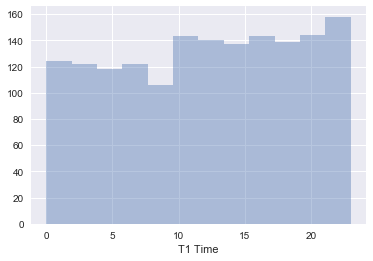

In [56]:
sns.distplot(eventsFridgeSmall['T1 Time'].dt.hour, kde=False)

** As expected the distrubution of fridge events is fairly constant throughout the day. It is slightly higher possibly because people open the doors of the fridge and so it cycles faster to maintain the cooling **

In [106]:
total = df['power'].sum()/(3600*1000)
ac1 = disaggAc1.sum()/(3600*1000)
ac2 = disaggAc2.sum()/(3600*1000)
pool = disaggPool.sum()/(3600*1000)
fridge = disaggFridgeSmall.sum()/(3600*1000)
print "Total monthly energy: ", total, " kWh"
record = [(ac1, ac2,pool, fridge, total)]
record.append([ac1*100/total, ac2*100/total, pool*100/total, fridge*100/total, total*100/total])
columns = ['AC1', 'AC2', 'Pool', 'Fridge', 'Total']
disagg_df = pd.DataFrame(record, columns=columns, index=['Energy (kWh)', '% of total'])

Total monthly energy:  2240  kWh


In [107]:
disagg_df

,AC1,AC2,Pool,Fridge,Total
Energy (kWh),437.282435,506.005808,104.236275,58.608678,2240
% of total,19.521537,22.589545,4.653405,2.616459,100


** Storing the results from the above separation **

In [57]:
def store_format(disagg):
    df = disagg.copy()
    df.index = df.index.tz_localize('America/Los_Angeles').tz_convert('UTC')
    df.index = df.index.astype('int64')// 10**9
    return df

In [58]:
store_format(disaggAc1).to_csv('./Ac1.csv')
store_format(disaggAc2).to_csv('./Ac2.csv')
store_format(disaggPool).to_csv('./Pool.csv')
store_format(disaggFridgeSmall).to_csv('./Fridge.csv')

## Appendix ##

In [59]:
# Unknown appliance
max_power_unknown = 163
min_power_unknown = 52
max_duration_unknown = 10300
min_duration_unknown  = 4000

In [60]:
eventsUnknown = events_small[(events_small['Average power']>=min_power_unknown)  &
                                 (events_small['Average power']<=max_power_unknown) &
                             (events_small['Duration']>=min_duration_unknown)  & 
                                 (events_small['Duration']<=max_duration_unknown)]

In [61]:
p = figure(width=1000, height=250, x_axis_type='datetime')

start = '2011-08-01'
end = '2011-08-07'
p.line(dfs[start:end].index, dfs[start:end]['power'].values)
p.scatter(eventsUnknown['T1 Time'].values, eventsUnknown["Average power"], color='green')
p.scatter(eventsUnknown['T2 Time'].values, eventsUnknown["Average power"], color='red')
show(p)

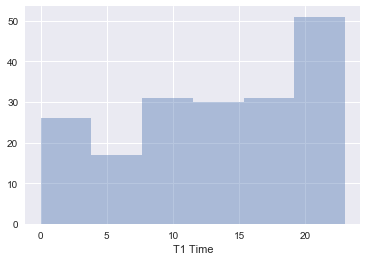

In [62]:
sns.distplot(eventsUnknown['T1 Time'].dt.hour, kde=False)

** there are significantly more such events during the data and late evening **

In [68]:
temp =  pd.read_csv('./Pool.csv', index_col=0)